# Min3Flow Pipeline

In [1]:
%load_ext autoreload
%autoreload 3

## Minimal Example

In [2]:
import torch
from min3flow.min3flow import Min3Flow

In [3]:
mflw = Min3Flow(global_seed=42)

### 1. Generate (with MinDalle)

In [15]:
%%time
prompt = 'Dali painting of a glider in infrared'
grid_size = 4 # Will create a grid of (4,4) images. Reduce this if running into OOM errors.
image = mflw.generate(prompt, grid_size=grid_size)

tokenizing text
['Ġdali']
['Ġpainting']
['Ġof']
['Ġa']
['Ġglider']
['Ġin']
['Ġinfrared']
9 text tokens [0, 21853, 1545, 111, 58, 24228, 91, 15126, 2]
encoding text tokens
detokenizing image
CPU times: user 14.9 s, sys: 1.29 s, total: 16.2 s
Wall time: 16.3 s


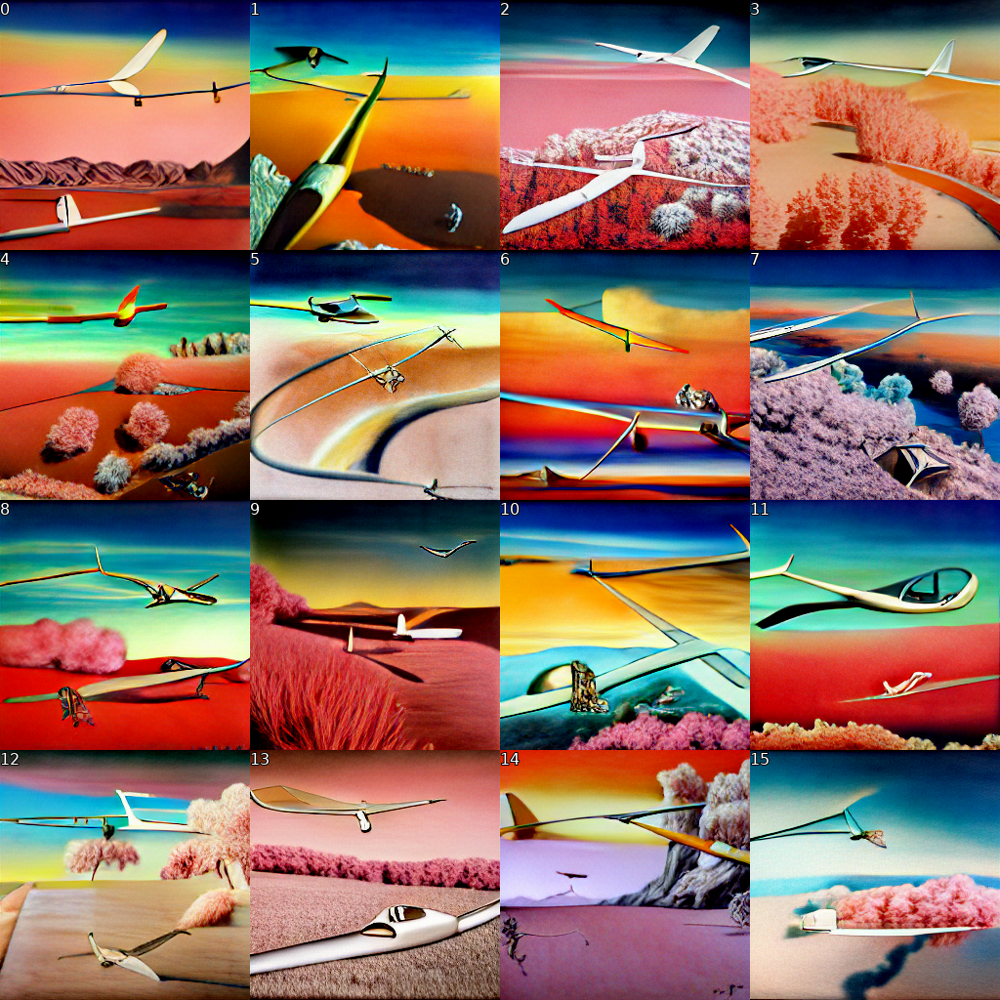

In [16]:
mflw.show_grid(image)

### 2. Diffuse (with Glid3XL)

In [24]:
%%time
Fav_id = 11
img_diff = mflw.diffuse(prompt, image, grid_idx=Fav_id)

load_models (5.65s)
load_clip (4.32s)
load_ldm (0.12s)
load_bert (5.64s)


  0%|          | 0/50 [00:00<?, ?it/s]

CPU times: user 2min 7s, sys: 4.78 s, total: 2min 11s
Wall time: 33.2 s


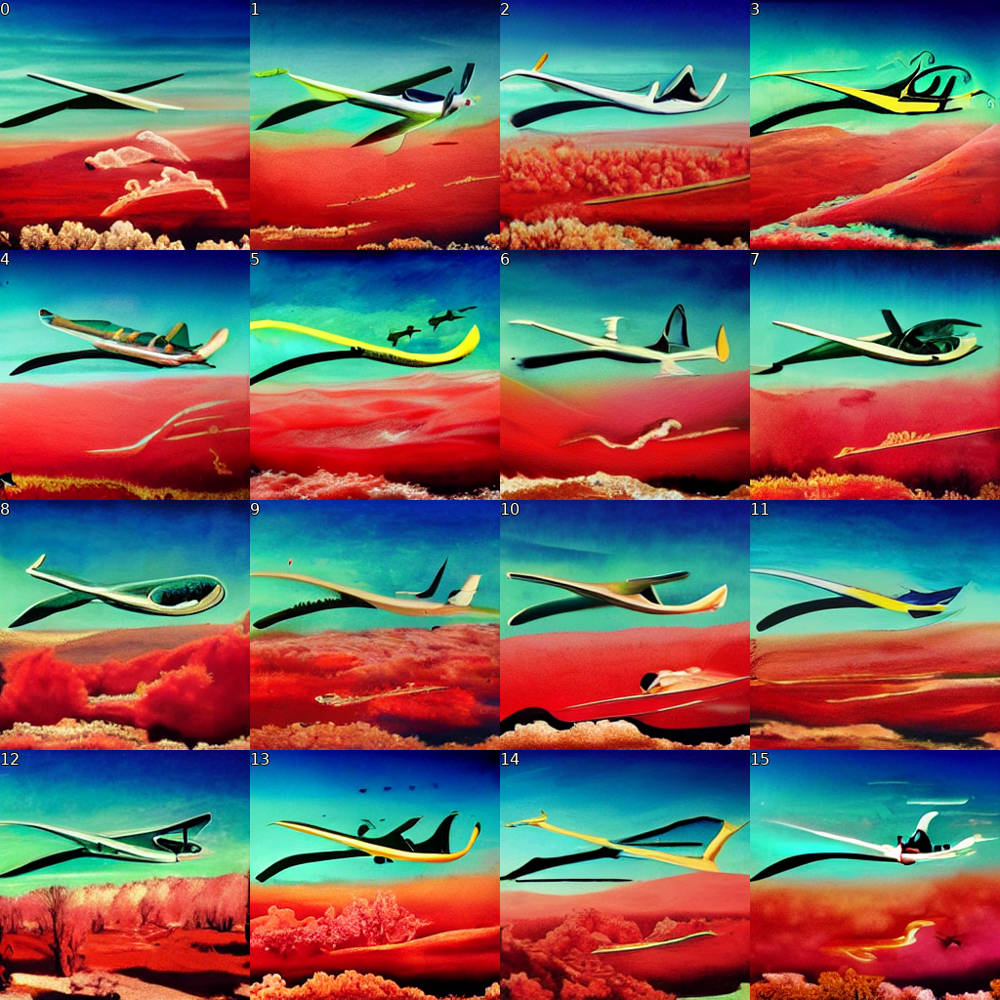

In [25]:
mflw.show_grid(img_diff)

### 3. Upsample (with SwinIR)

In [26]:
%%time
img_up = mflw.upscale(img_diff[12])

CPU times: user 1min 21s, sys: 71 ms, total: 1min 21s
Wall time: 1.66 s


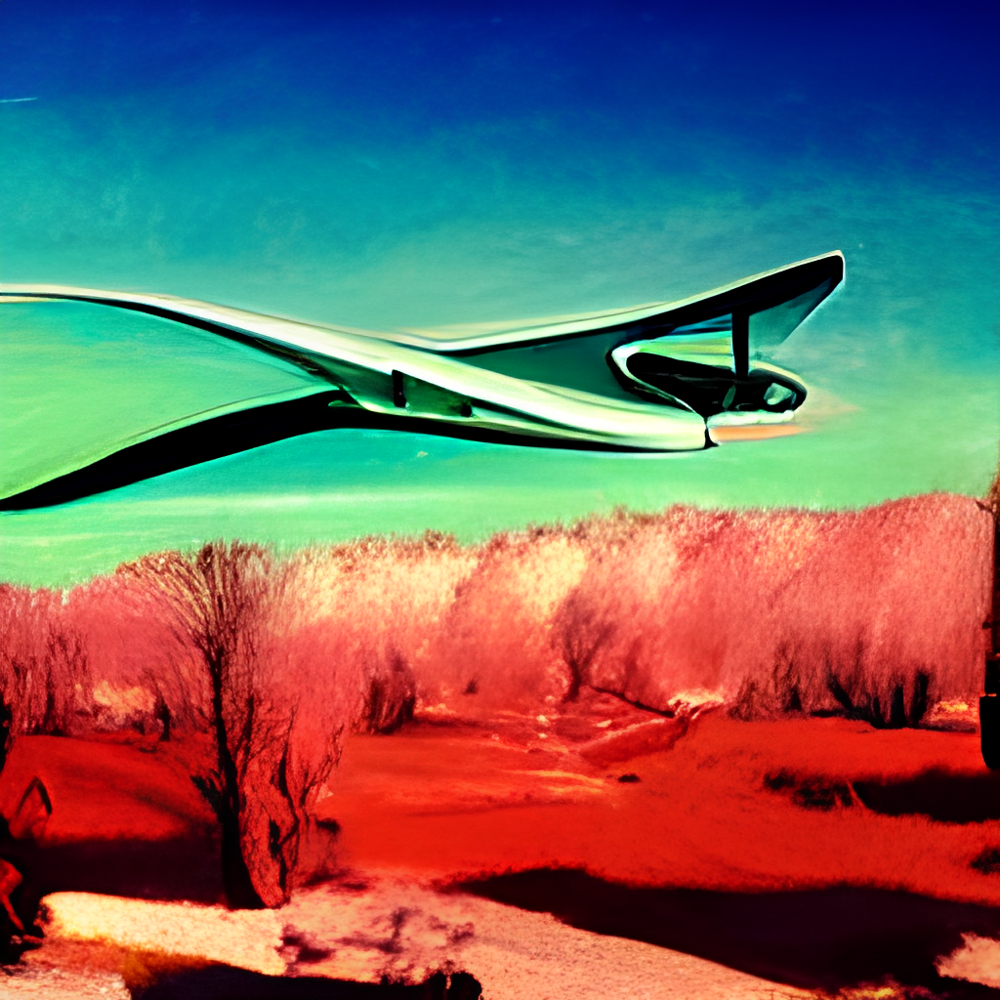

In [27]:
mflw.show_grid(img_up)

## Full Configuration

In [31]:
from pathlib import Path

import torch

from min3flow.configuration import BaseConfig, MinDalleConfig, MinDalleExtConfig, Glid3XLConfig, Glid3XLClipConfig, SwinIRConfig
from min3flow.min3flow import Min3Flow

### 0. Configure

In [55]:
dalle_config = MinDalleConfig(dtype=torch.float32)
glid3xl_config = Glid3XLConfig(guidance_scale=5.0, batch_size=16, steps=200, diffusion_weight='inpaint.pt')
#glid3xl_config = Glid3XLClipConfig(clip_guidance_scale=500, guidance_scale=3.0, batch_size=1, steps=100,)
swinir_config = SwinIRConfig()

mflw = Min3Flow(dalle_config=dalle_config, 
                glid3xl_config=glid3xl_config, 
                swinir_config=swinir_config, 
                persist='cpu', 
                global_seed=42)

### 1. Generate (with MinDalle)

In [12]:
%%time
prompt = 'Dali painting of a glider in infrared'
grid_size = 4 # Will create a grid of (4,4) images. Reduce this if running into OOM errors.
image = mflw.generate(
    prompt, 
    grid_size=grid_size, 
    supercondition_factor=32, 
    temperature=1.0,
)

using device cuda
intializing TextTokenizer
initializing DalleBartEncoder
initializing DalleBartDecoder
initializing VQGanDetokenizer
tokenizing text
['Ġdali']
['Ġpainting']
['Ġof']
['Ġa']
['Ġglider']
['Ġin']
['Ġinfrared']
9 text tokens [0, 21853, 1545, 111, 58, 24228, 91, 15126, 2]
encoding text tokens
detokenizing image
CPU times: user 54.9 s, sys: 6.46 s, total: 1min 1s
Wall time: 30.1 s


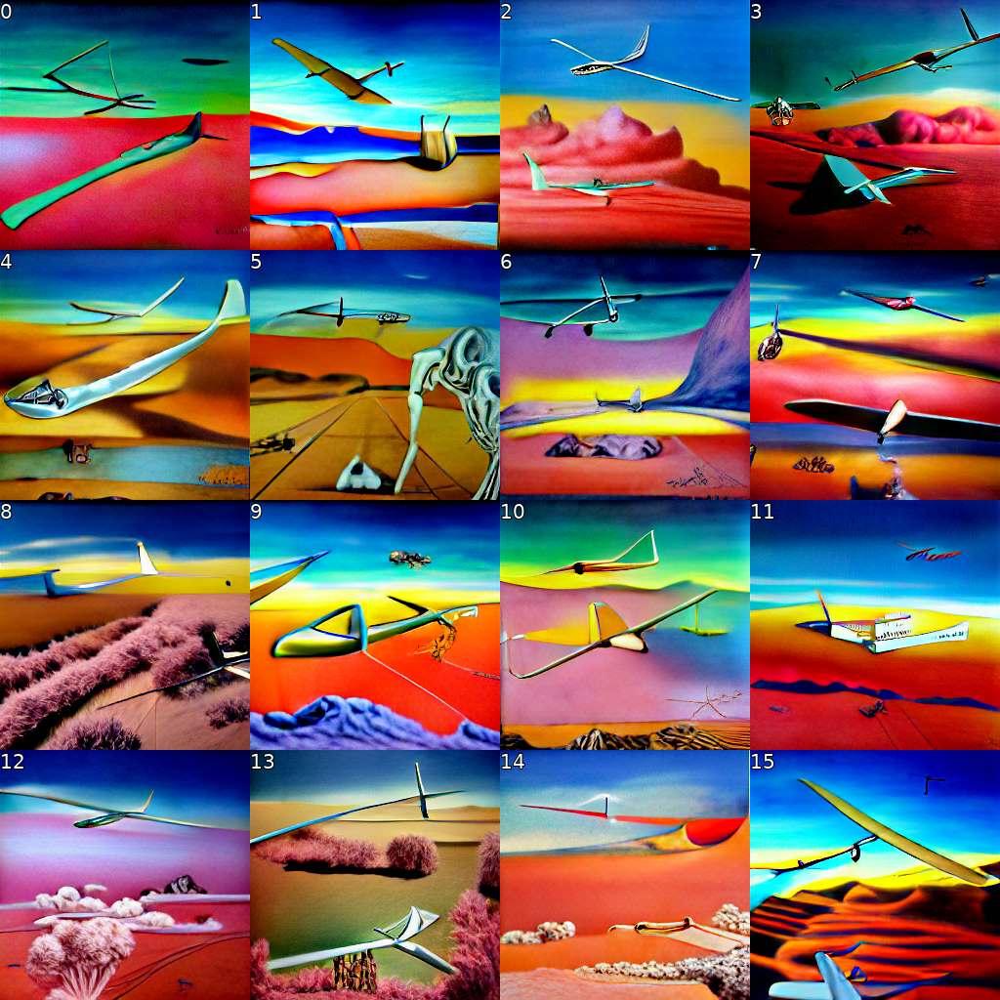

In [13]:
mflw.show_grid(image)

### 2. Diffuse (with Glid3XLClip)

In [14]:
%%time
Fav_id = 2
img_diff = mflw.diffuse(image, 
                        grid_idx=Fav_id, 
                        skip_rate=0.5, 
                        text = prompt,)

load_models (5.71s)
load_clip (4.46s)
load_ldm (0.10s)
encode_text (5.42s)


  0%|          | 0/50 [00:00<?, ?it/s]

CPU times: user 2min 47s, sys: 9.4 s, total: 2min 57s
Wall time: 39.7 s


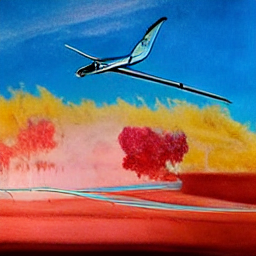

In [15]:
img_diff

In [16]:
print(torch.cuda.max_memory_allocated()/1e9)
torch.cuda.reset_peak_memory_stats()
print(torch.cuda.max_memory_allocated()/1e9)

11.290547712
4.779140096


In [12]:
#print(torch.cuda.memory_summary())

### 3. Upsample (with SwinIR)

In [17]:
%%time
img_up = mflw.upscale(img_diff, tile=None)

CPU times: user 1min 24s, sys: 539 ms, total: 1min 25s
Wall time: 2.68 s


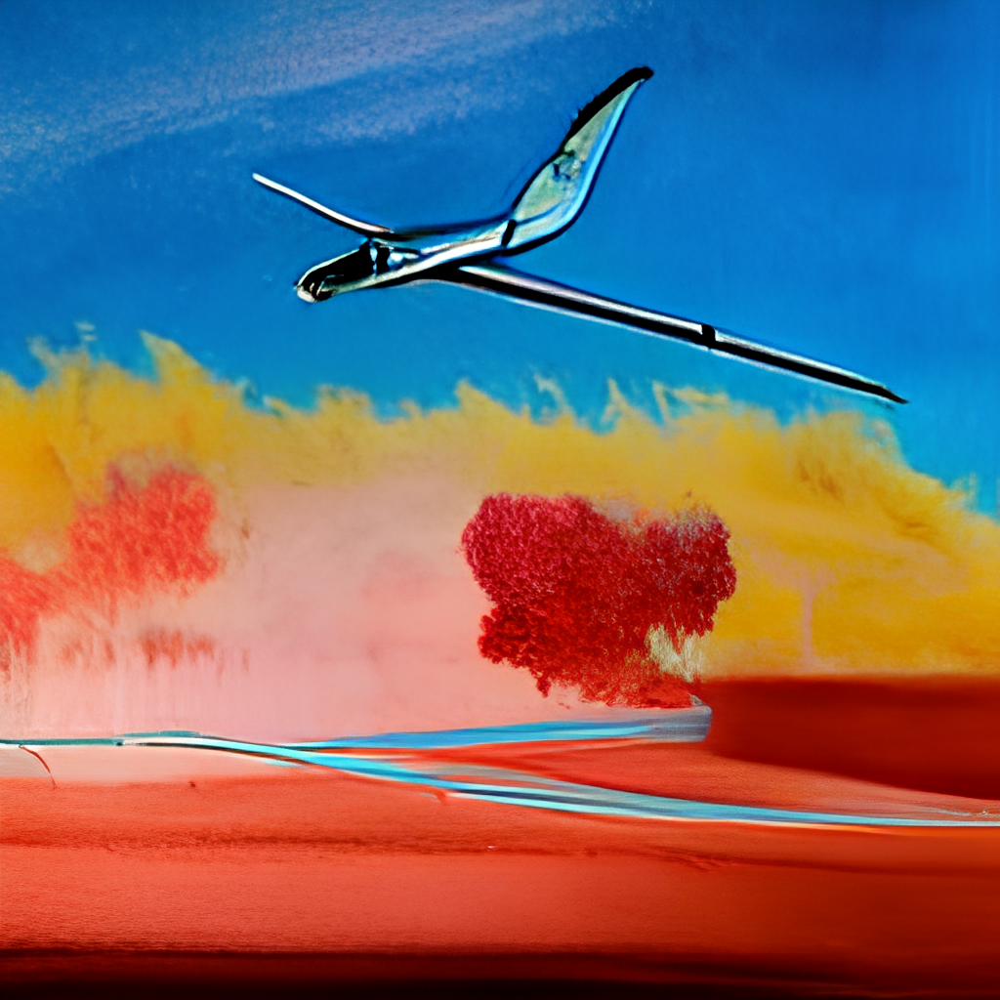

In [18]:
img_up

## Run Again

The overhead for running any stage again is reduced to CPU->GPU transfer rather than disk->CPU->GPU transfer. On average, this reduces the run time by ~50%.

In [74]:
%%time
prompt = 'a group of penguins roasting ice cubes around campfire, 3d render'
image = mflw.generate(prompt, supercondition_factor=32, temperature=1.0)

tokenizing text
['Ġa']
['Ġgroup']
['Ġof']
['Ġpenguins']
['Ġroasting']
['Ġice']
['Ġcubes']
['Ġaround']
['Ġcampfire', ',']
['Ġ3', 'd']
['Ġrender']
15 text tokens [0, 58, 1321, 111, 19878, 43848, 2330, 23841, 2882, 34421, 11, 204, 31, 14110, 2]
encoding text tokens
detokenizing image
CPU times: user 16.5 s, sys: 1.6 s, total: 18.1 s
Wall time: 18.2 s


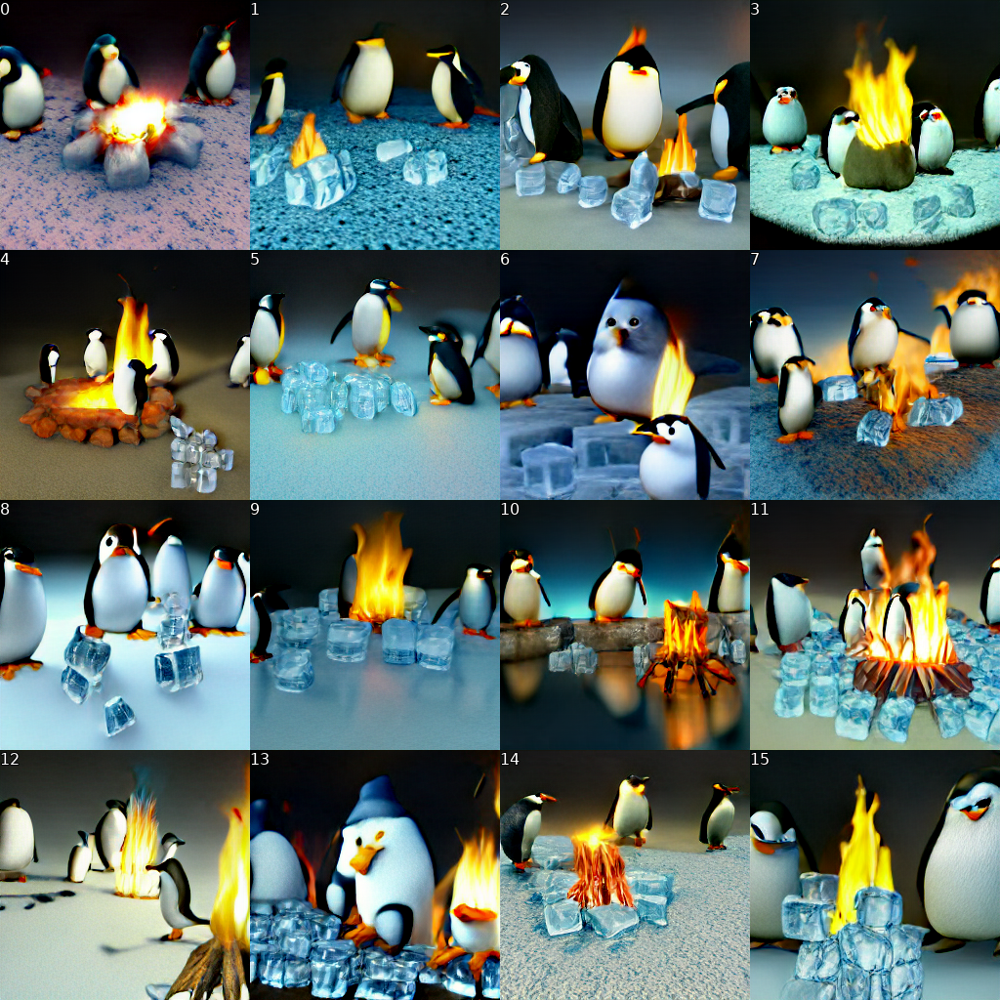

In [75]:
mflw.show_grid(image)

In [76]:
%%time
imgdiff = mflw.diffuse(prompt, image, grid_idx=[14,15])

  0%|          | 0/100 [00:00<?, ?it/s]

CPU times: user 1min 54s, sys: 5.16 s, total: 1min 59s
Wall time: 34.7 s


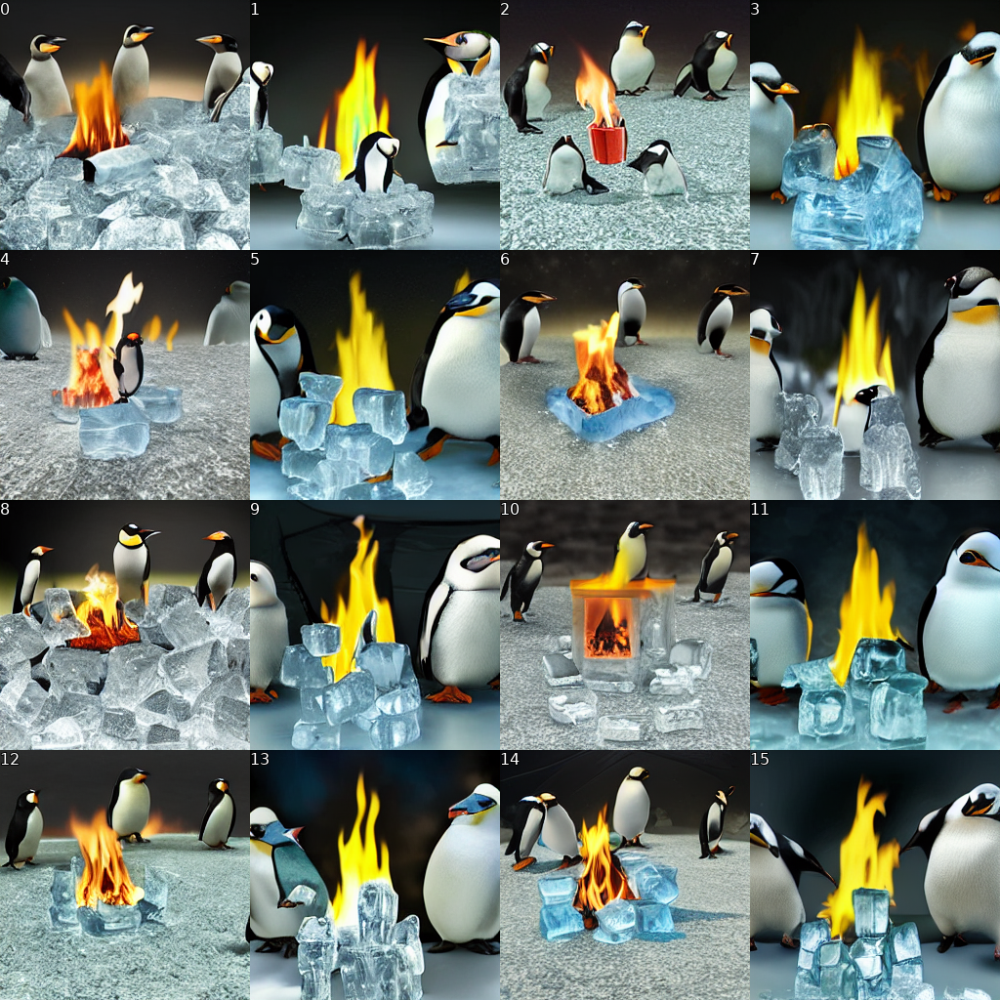

In [77]:
 mflw.show_grid(imgdiff)

In [78]:
%%time
imgup = mflw.upscale(imgdiff[12])

CPU times: user 44.1 s, sys: 247 ms, total: 44.4 s
Wall time: 1.68 s


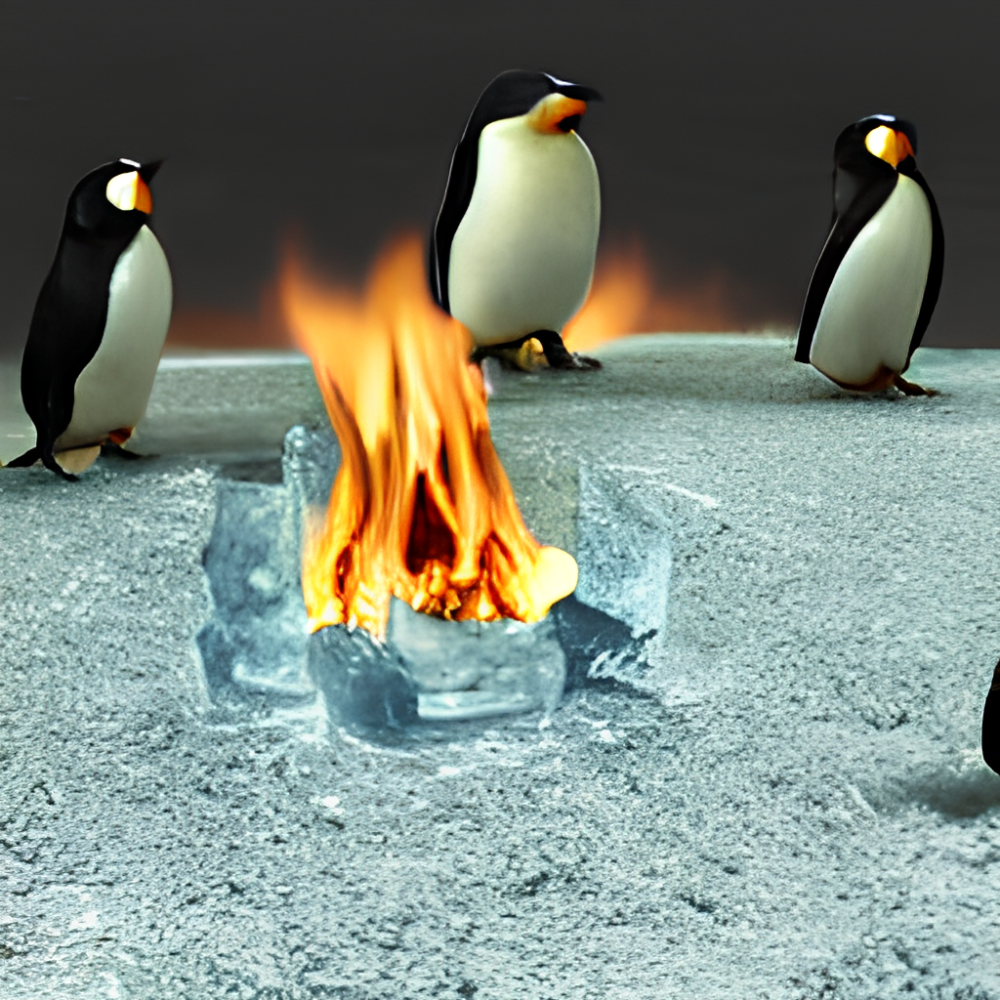

In [79]:
mflw.show_grid(imgup)